# CITY GRAPH
- 500 of the most populated cities in the world

## Creating The Graph
- Tried to make it pretty but eh

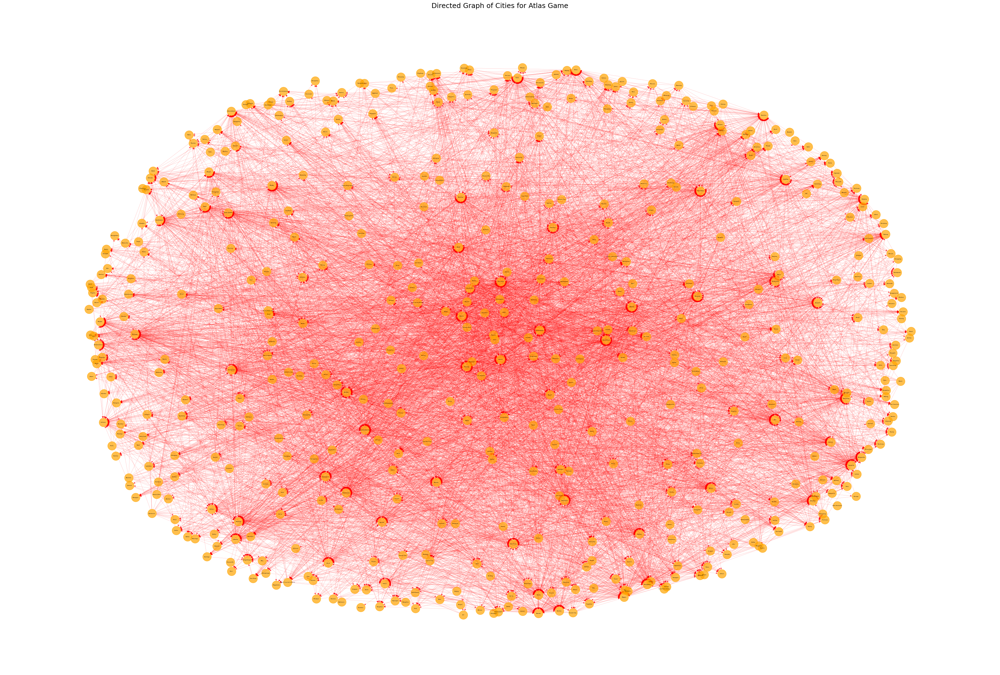

Number of nodes: 500
Number of edges: 7282


In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

# Load city data
file_path = './data/cities.csv'  # Replace with your file path
df = pd.read_csv(file_path)

# Extract city names
cities = df['city'].str.strip().tolist()

# Create a directed graph
G_cities = nx.DiGraph()

# Add edges based on the Atlas game rule
for city in cities:
    last_letter = city[-1].lower()
    for other_city in cities:
        if other_city[0].lower() == last_letter and city != other_city:
            G_cities.add_edge(city, other_city)

# Plot the graph
plt.figure(figsize=(36, 24))  # Increase figure size for better visibility
pos = nx.spring_layout(G_cities, k=1.2, seed=42)  # Spring layout for better spacing
nx.draw(
    G_cities, pos, with_labels=True, node_size=500, node_color='orange',
    edge_color='red', font_size=3, font_weight='bold', width=0.2, alpha=0.7
)
plt.title('Directed Graph of Cities for Atlas Game', fontsize=18)
plt.show()

# Basic graph information
print(f"Number of nodes: {G_cities.number_of_nodes()}")
print(f"Number of edges: {G_cities.number_of_edges()}")


## MINIMAX WITH ALPHA-BETA PRUNING
- For the cities graph, I chose this method over the Monte Carlo Tree Simulation i was running previously on the countries graph as I felt that exploring Atlas as a perfect information, deterministic game rather than a random one would provide me more insights. I may eventually do the same for my countries graph as well.
- So assuming we have full knowledge already, whhy would we perform unnecessary random simulations?
- Might as well assume our players are smart and make optimal decisions.
- Additionally, Minimax is simply more interpretable and transparent. I felt this would be very appropriate given the nature of Precog's research on explainability.

In [ ]:
import networkx as nx
import random

# Evaluation function: count remaining valid moves
def evaluate_state(graph, maximizing_player):
    return len(list(graph.nodes))  # Higher score is better for the maximizer

# Optimized Minimax with Alpha-Beta Pruning (Returns Full Move Sequence)
def minimax_pruned(graph, city, depth, alpha, beta, maximizing_player, move_sequence):
    if depth == 0 or city not in graph:
        return evaluate_state(graph, maximizing_player), move_sequence  # Return full sequence

    successors = list(graph.successors(city))
    if not successors:
        return (-1e9 if maximizing_player else 1e9), move_sequence  # Losing condition

    best_sequence = move_sequence
    best_move = None

    if maximizing_player:
        max_eval = -float('inf')
        for move in successors:
            new_graph = graph.copy()
            new_graph.remove_node(city)  # Remove played city
            eval_score, new_sequence = minimax_pruned(new_graph, move, depth - 1, alpha, beta, False, move_sequence + [move])

            if eval_score > max_eval:
                max_eval, best_move = eval_score, new_sequence

            alpha = max(alpha, eval_score)
            if beta <= alpha:
                break  # Alpha-Beta Pruning: Stop exploring this branch

        return max_eval, best_move
    else:
        min_eval = float('inf')
        for move in successors:
            new_graph = graph.copy()
            new_graph.remove_node(city)
            eval_score, new_sequence = minimax_pruned(new_graph, move, depth - 1, alpha, beta, True, move_sequence + [move])

            if eval_score < min_eval:
                min_eval, best_move = eval_score, new_sequence

            beta = min(beta, eval_score)
            if beta <= alpha:
                break  # Alpha-Beta Pruning: Stop exploring this branch

        return min_eval, best_move

# Function to get the full optimal move sequence with Alpha-Beta Pruning
def get_optimal_move_sequence_pruned(graph, start_city, depth=5):
    _, optimal_sequence = minimax_pruned(graph, start_city, depth, -float('inf'), float('inf'), True, [start_city])
    return optimal_sequence

# Example Usage
current_city = "Bangalore"  # Example starting city
optimal_sequence = get_optimal_move_sequence_pruned(G_cities, current_city, depth=6)

print("Optimal Move Sequence:")
print(" → ".join(optimal_sequence) if optimal_sequence else "No valid moves left!")


Optimal Move Sequence:
Bangalore → Eşfahān → Ningde → Ecatepec → Chengdu


## REINFORCEMENT LEARNING (Q-LEARNING)
- Let's go one step further. Why stop at assumed optimal moves when we can more realistically simulate the game?
- With RL, we can:
  - Find optimal move sequences by trial and error.
  - Adapt to different game graphs dynamically.
  - Handle large graphs better than Minimax.
  - Self-improve over time, meaning it can discover new strategies.

In [ ]:
import numpy as np
import networkx as nx
import random

# Initialize Q-Table
Q = {}

# Parameters
alpha = 0.1  # Learning rate
gamma = 0.9  # Discount factor
epsilon = 0.1  # Exploration rate (epsilon-greedy)
num_episodes = 5000  # Number of training games

# Define the reward function
def get_reward(graph, city):
    if city not in graph:
        return -100  # Large negative reward for losing move
    return len(list(graph.successors(city)))  # More successors = higher reward

# Function to choose the next move using epsilon-greedy strategy (Avoiding visited cities)
def choose_action(graph, current_city, visited):
    possible_moves = [city for city in graph.successors(current_city) if city not in visited]

    if not possible_moves:
        return None  # No valid moves

    if random.uniform(0, 1) < epsilon:
        return random.choice(possible_moves)  # Explore
    return max(possible_moves, key=lambda x: Q.get((current_city, x), 0), default=None)  # Exploit


# Q-Learning Training Loop
for episode in range(num_episodes):
    current_city = random.choice(list(G_cities.nodes))  # Start at a random city
    visited = set()

    while current_city in G_cities and list(G_cities.successors(current_city)):
        next_city = choose_action(G_cities, current_city,visited)
        if not next_city:
            break  # No valid moves, game ends

        # Compute reward
        reward = get_reward(G_cities, next_city)

        # Q-learning update
        old_q = Q.get((current_city, next_city), 0)
        max_future_q = max([Q.get((next_city, future_city), 0) for future_city in G_cities.successors(next_city) if future_city not in visited], default=0)
        Q[(current_city, next_city)] = (1 - alpha) * old_q + alpha * (reward + gamma * max_future_q)

        # Move to the next city
        visited.add(current_city)
        current_city = next_city

# Print trained Q-values
print("Trained Q-Table:")
for (state, action), value in sorted(Q.items(), key=lambda x: -x[1]):
    print(f"{state} → {action}: {value:.6f}")


Trained Q-Table:
Abuja → Algiers: 309.439026
Nagoya → Algiers: 308.189018
Dhaka → Algiers: 307.356402
Shanghai → Indianapolis: 302.568255
Seoul → Lagos: 302.553929
Delhi → Indianapolis: 301.202935
Karachi → Indianapolis: 294.488772
Algiers → Seoul: 286.982220
Ahmedabad → Dhaka: 278.948846
Lagos → Shanghai: 277.306819
Indianapolis → Shanghai: 277.300683
Kolkāta → Ahmedabad: 269.914954
Shanghai → Istanbul: 264.821909
Istanbul → Lagos: 264.659089
Nairobi → Indianapolis: 262.850798
Gujranwala → Abuja: 261.080548
New York → Kolkāta: 255.640481
Lubumbashi → Indianapolis: 252.870398
Liaocheng → Gujranwala: 250.409199
Omdurman → New York: 245.166301
Guilin → New York: 245.059936
Abuja → Ahmedabad: 239.720500
Yancheng → Gujranwala: 234.751351
Nanyang → Guayaquil: 234.360957
Incheon → New York: 234.306829
Kigali → Istanbul: 233.781951
Addis Ababa → Ahmedabad: 233.694485
Awka → Ahmedabad: 233.216117
Eşfahān → Nagoya: 229.837762
Nanchang → Guayaquil: 227.279724
Guayaquil → Liaocheng: 226.723640
Na

In [ ]:
import numpy as np
import random

# Function to generate an optimal sequence of moves
def get_optimal_move_sequence(start_city, max_moves=10):
    current_city = start_city
    sequence = [current_city]

    for _ in range(max_moves):
        if current_city not in G_cities or not list(G_cities.successors(current_city)):
            break  # Stop if no moves are left

        next_city = min(G_cities.successors(current_city), key=lambda x: Q.get((current_city, x), 0), default=None)
        if not next_city or next_city in sequence:  # Avoid cycles
            break

        sequence.append(next_city)
        current_city = next_city

    return sequence

# Run optimal sequences from multiple starting points
starting_cities = random.sample(list(G_cities.nodes), 8)  # Pick 5 random starting cities
optimal_sequences = {city: get_optimal_move_sequence(city, max_moves=10) for city in starting_cities}

# Print the results
for city, sequence in optimal_sequences.items():
    print(f"\nOptimal sequence from {city}:")
    print(" → ".join(sequence))



Optimal sequence from Nāgpur:
Nāgpur → Rawalpindi → Indianapolis → Shangqiu

Optimal sequence from Shangqiu:
Shangqiu

Optimal sequence from Denver:
Denver → Riyadh → Hangzhou

Optimal sequence from Huizhou:
Huizhou

Optimal sequence from Jiamusi:
Jiamusi → Ibadan → Nangandao → Ouagadougou

Optimal sequence from Luanda:
Luanda → Atlanta → Ankara → Ankang → Guangzhou

Optimal sequence from Riyadh:
Riyadh → Hangzhou

Optimal sequence from Shenzhen:
Shenzhen → New York → Kaohsiung → Guangzhou


### ACTIONABLE INSIGHTS
- As we've consistently seen across the MCTS and Q-Learning based game simulation, we do in fact have a winning strategy here, and it involves the letter U.
- In the top 500 most populated cities, none of them begin with the letter U.
- And quite fortunately, an absurd number of Chinese citiees happen to end in this same letter.
- Light work free win not even close.
- Unfortunately, this offers us SEVERAL instant one-win moves, and will 100% make all our reward-based simulation algorithms tend toward giving the opponent cities starting with U.
- In the sequences I list above, note that in the sequences with an **ODD** length sequence, the person who started wins, and in the **EVEN** length sequences, the person who went second ins.

## GENERIC TWO-PLAYER SIMULATION
- The cell below holds my generic game simulation function that takes in `smart_player_move` and `dumb_player_move`, the move-choosing functions for both the players, and returns who won over a single game.
- Set the `visualize` parameter equal to `True` to actually see the games being played to convince yourself that I'm not just gaslighting you hehe :)

In [ ]:
# Function to simulate a single game
def simulate_game(graph, start_city, smart_player_move, dumb_player_move, max_moves=50, visualize=False):
    current_graph = graph.copy()
    visited = set()
    current_city = start_city
    turn = 0  # 0 = Smart Player, 1 = Random Player

    if visualize:
        print(f"\n🔹 Starting city: {start_city}")

    for move in range(1, max_moves + 1):
        # Determine current player
        if turn == 0:
            next_city = smart_player_move(current_graph, current_city, visited)
        else:
            next_city = random_player_move(current_graph, current_city, visited)

        if next_city is None:  # If a player has no valid moves, they lose
            return turn  # Return the player number (0 = Smart, 1 = Random) who lost

        # Remove current city from graph
        visited.add(current_city)
        current_graph.remove_node(current_city)
        current_city = next_city

        # Switch turns
        turn = 1 - turn  # Alternate between 0 and 1

        if visualize:
            print(f"Move {move}: {'Smart' if turn == 1 else 'Random'} → {current_city}")

    return None  # If the game reaches max moves, it's a draw

# Random Player Strategy: Selects a random valid move
def random_player_move(graph, current_city, visited):
    successors = [i for i in list(graph.successors(current_city)) if i not in visited]
    if not successors:
        return None  # No valid moves

    return random.choice(successors)

## IN-DEGREE TO OUT-DEGREE RATIO
- Same rationale as I had for the countries. Let's see how this plays out.

In [7]:
import matplotlib.pyplot as plt
import networkx as nx

# Compute in-degree and out-degree for each city
in_degrees = dict(G_cities.in_degree())  # Number of cities leading to this city
out_degrees = dict(G_cities.out_degree())  # Number of cities this city leads to

# Calculate In-Degree to Out-Degree Ratio
ratio = {node: in_degrees[node] / (out_degrees[node] + 1) for node in G_cities.nodes}  # Adding 1 to prevent division by zero

# Sort cities by highest in-degree to out-degree ratio (most dangerous traps)
sorted_ratio = sorted(ratio.items(), key=lambda x: x[1], reverse=True)

# Display Top 10 Traps
print("\nTop 10 Most Dangerous Trap Cities:")
for city, r in sorted_ratio[:10]:
    print(f"{city}: Ratio = {r:.2f} (In: {in_degrees[city]}, Out: {out_degrees[city]})")



Top 10 Most Dangerous Trap Cities:
Guangzhou: Ratio = 87.00 (In: 87, Out: 0)
Ganzhou: Ratio = 87.00 (In: 87, Out: 0)
Gulou: Ratio = 87.00 (In: 87, Out: 0)
Ouagadougou: Ratio = 34.00 (In: 34, Out: 0)
Ningde: Ratio = 29.33 (In: 88, Out: 2)
Nangandao: Ratio = 22.00 (In: 88, Out: 3)
Ningbo: Ratio = 22.00 (In: 88, Out: 3)
Indore: Ratio = 17.00 (In: 51, Out: 2)
Shangqiu: Ratio = 17.00 (In: 17, Out: 0)
Suzhou: Ratio = 17.00 (In: 17, Out: 0)


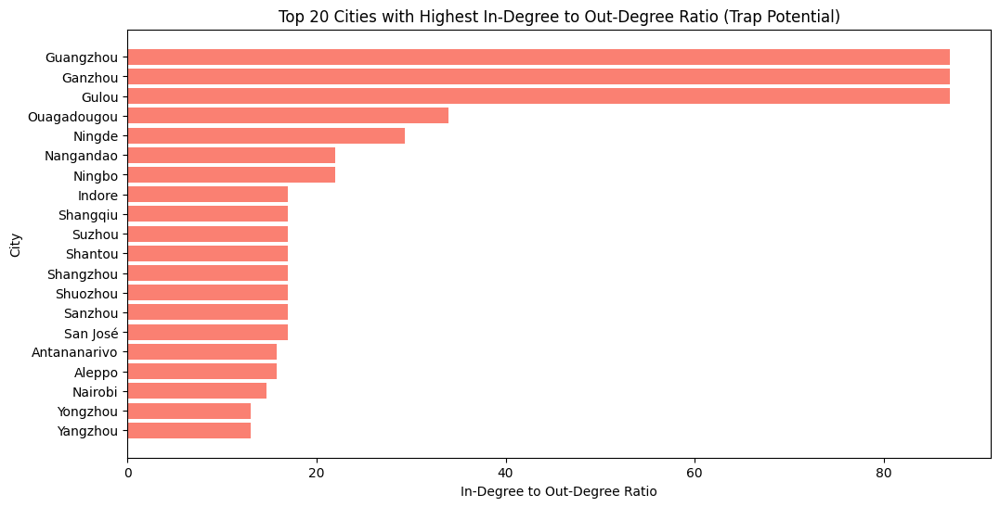

In [8]:
# Extract top 20 cities by ratio for visualization
top_cities, top_ratios = zip(*sorted_ratio[:20])

plt.figure(figsize=(12, 6))
plt.barh(top_cities[::-1], top_ratios[::-1], color='salmon')  # Reverse for better visualization
plt.xlabel('In-Degree to Out-Degree Ratio')
plt.ylabel('City')
plt.title('Top 20 Cities with Highest In-Degree to Out-Degree Ratio (Trap Potential)')
plt.show()

In [10]:
import random
import matplotlib.pyplot as plt

# Function to compute average in-degree to out-degree ratio at a given game state
def compute_avg_ratio(graph):
    if len(graph.nodes) == 0:
        return 0  # No cities left to calculate
    in_degrees = dict(graph.in_degree())
    out_degrees = dict(graph.out_degree())
    ratios = [in_degrees[node] / (out_degrees[node] + 1) for node in graph.nodes]  # Avoid division by zero
    return sum(ratios) / len(ratios)  # Compute average ratio

# Function to simulate a game and track ratio evolution
def simulate_game_and_track_ratios(graph, start_city, max_moves=50):
    current_graph = graph.copy()
    current_city = start_city
    visited = set()

    # Track average in-degree to out-degree ratio over time
    avg_ratios = []
    move_number = []

    for move in range(max_moves):
        if current_city not in current_graph or not list(current_graph.successors(current_city)):
            break  # No moves left

        # Compute average ratio at current time step
        avg_ratio = compute_avg_ratio(current_graph)
        avg_ratios.append(avg_ratio)
        move_number.append(move)

        # Select the best trap move (force opponent into worst position)
        successors = [i for i in list(current_graph.successors(current_city)) if i not in visited]
        if not successors:
            break  # No valid moves
        next_city = max(successors, key=lambda x: Q.get((current_city, x), 0), default=None)

        # Remove current city to reflect game state
        current_graph.remove_node(current_city)
        visited.add(current_city)
        current_city = next_city

    return move_number, avg_ratios

# Run simulation from multiple start points
start_cities = random.sample(list(G_cities.nodes), 6)  # Choose 3 random starting cities
simulations = {city: simulate_game_and_track_ratios(G_cities, city, max_moves=100) for city in start_cities}

# Plot the evolution of the average in-degree to out-degree ratio
plt.figure(figsize=(12, 6))
for city, (moves, avg_ratios) in simulations.items():
    plt.plot(moves, avg_ratios, marker='o', linestyle='-', label=f'Start: {city}')

plt.xlabel('Moves Played')
plt.ylabel('Average In-Degree to Out-Degree Ratio')
plt.title('Evolution of Average In-Degree to Out-Degree Ratio Over the Game')
plt.legend()
plt.grid(True)
plt.show()


NameError: name 'Q' is not defined

### ACTIONABLE INSIGHTS:
- Ratio seems to show a general increasing trend as the number of moves increase. This is due to the greater rate of decay of the out-degree in comparison to the in-degree.
- The cities with a higher ratio are the ones you should aim to play the most, as they are the easiest to access but the hardest to get out of. In the specific case of a city-only graph, spamming cities ending with a U is truly an optimal strategy. The next best letters to end with are E, then O.
- To prove that im not just mindlessly yapping and on to absolutely nothing, let's simulate 100 games with two players pitted against each other. A smart player using SOLELY insights from the in-out degree ratio to make decisions, and a dumb player randomly selecting moves.
- Note here that a draw simply means we hit a predifined max number of moves (sort of equivalent to a time limit in real life). However, remember that real Atlas has no max number of moves unless you are a wimp.

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import random

# Function to compute in-degree to out-degree ratio for each city
def compute_ratio(graph):
    in_degrees = dict(graph.in_degree())
    out_degrees = dict(graph.out_degree())
    return {node: in_degrees[node] / (out_degrees[node] + 1) for node in graph.nodes}  # Avoid division by zero

# Smart Player Strategy: Selects the move with the highest in-degree to out-degree ratio
def smart_inout_move(graph, current_city, visited):
    successors = [i for i in list(graph.successors(current_city)) if i not in visited]
    if not successors:
        return None  # No valid moves

    return max(successors, key=lambda x: compute_ratio(graph).get(x, 0), default=None)

# Random Player Strategy: Selects a random valid move
def random_player_move(graph, current_city, visited):
    successors = [i for i in list(graph.successors(current_city)) if i not in visited]
    if not successors:
        return None  # No valid moves

    return random.choice(successors)

# Function to simulate multiple games and compute win rates
def simulate_multiple_games(graph, num_games=100):
    start_cities = random.sample(list(graph.nodes), num_games)  # Select random start cities
    smart_wins, random_wins, draws = 0, 0, 0

    for start_city in start_cities:
        result = simulate_game(graph, start_city, smart_inout_move, random_player_move, max_moves=50, visualize=False)

        if result == 0:
            random_wins += 1  # Smart Player lost
        elif result == 1:
            smart_wins += 1  # Random Player lost
        else:
            draws += 1  # Max moves reached

    return smart_wins, random_wins, draws

# Run multiple simulations
num_simulations = 100
smart_wins, random_wins, draws = simulate_multiple_games(G_cities, num_games=num_simulations)

# Print win statistics
print(f"\n📊 Simulation Results ({num_simulations} games):")
print(f"✅ Smart Player Wins: {smart_wins} ({(smart_wins / num_simulations) * 100:.2f}%)")
print(f"❌ Random Player Wins: {random_wins} ({(random_wins / num_simulations) * 100:.2f}%)")
print(f"➖ Draws: {draws} ({(draws / num_simulations) * 100:.2f}%)")


In [ ]:
# Plot win rates
labels = ['Smart Player', 'Random Player', 'Draws']
wins = [smart_wins, random_wins, draws]

plt.figure(figsize=(8, 5))
plt.bar(labels, wins, color=['blue', 'red', 'gray'])
plt.xlabel('Player')
plt.ylabel('Number of Wins')
plt.title(f'Win Rates Over {num_simulations} Games')
plt.show()

## STRONGLY CONNECTED COMPONENTS
- Once again, same rationale as the country graph for choosing this one.
-  If you're inside a large SCC, you have many valid moves and can survive longer.
- If you force your opponent into a small SCC, they run out of options quickly.
- Tracking SCC evolution over time lets you predict when the game will end.

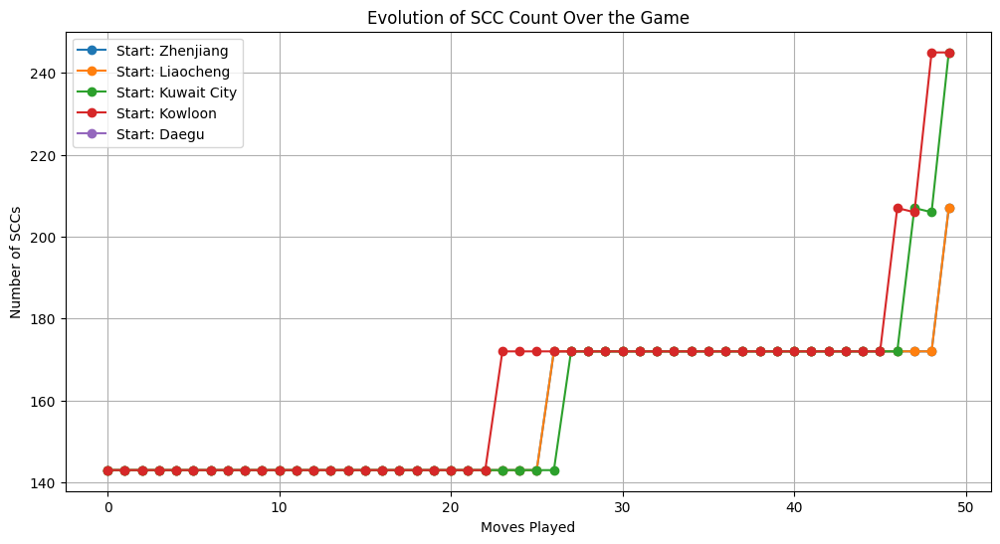

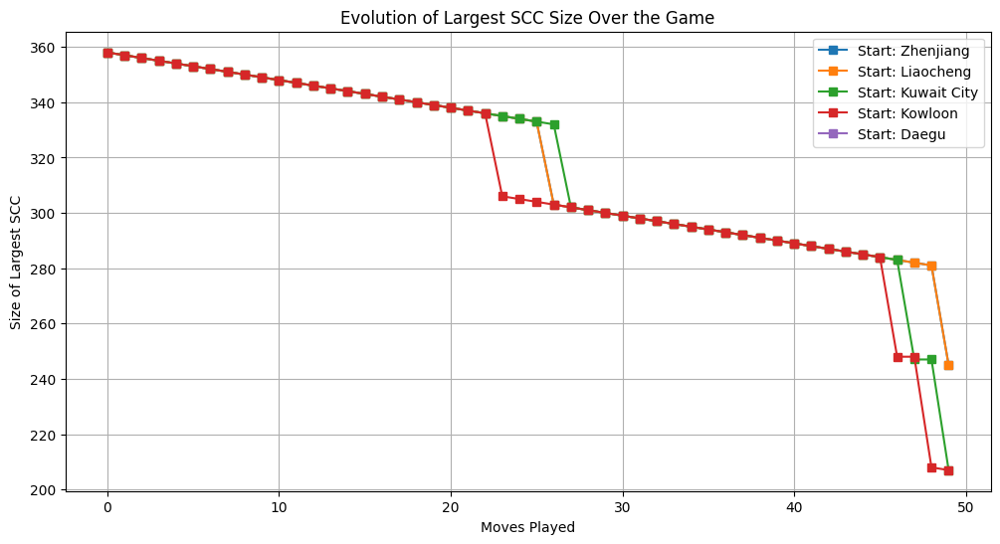

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import random

sorted_sccs = sorted(list(nx.strongly_connected_components(G_cities)), key=len, reverse=True)
# Function to track SCC evolution over time
def simulate_game_and_track_scc_metrics(graph, start_city, max_moves=50):
    current_graph = graph.copy()
    visited = set()

    num_sccs = []
    largest_scc_sizes = []
    move_number = []

    current_city = start_city

    for move in range(max_moves):
        if current_city not in current_graph or not list(current_graph.successors(current_city)):
            break  # No moves left

        # Compute SCC count and largest SCC size at current time step
        sccs = list(nx.strongly_connected_components(current_graph))
        num_sccs.append(len(sccs))
        largest_scc_sizes.append(len(max(sccs, key=len)))
        move_number.append(move)

        # Ensure we only select unvisited successors
        successors = [i for i in list(current_graph.successors(current_city)) if i not in visited]
        if not successors:
            break  # No valid moves

        # Choose the move that keeps us in the largest SCC
        next_city = max(successors, key=lambda x: len([scc for scc in sccs if x in scc][0]), default=None)

        # Remove current city to reflect game state
        current_graph.remove_node(current_city)
        visited.add(current_city)
        current_city = next_city

    return move_number, num_sccs, largest_scc_sizes

# Run multiple simulations to track SCC evolution
start_cities = random.sample(list(G_cities.nodes), 5)  # Choose 5 random starting cities
simulations = {city: simulate_game_and_track_scc_metrics(G_cities, city, max_moves=50) for city in start_cities}

# Plot SCC evolution over time
plt.figure(figsize=(12, 6))
for city, (moves, scc_counts, largest_sizes) in simulations.items():
    plt.plot(moves, scc_counts, marker='o', linestyle='-', label=f'Start: {city}')

plt.xlabel('Moves Played')
plt.ylabel('Number of SCCs')
plt.title('Evolution of SCC Count Over the Game')
plt.legend()
plt.grid(True)
plt.show()

# Plot Largest SCC size over time
plt.figure(figsize=(12, 6))
for city, (moves, scc_counts, largest_sizes) in simulations.items():
    plt.plot(moves, largest_sizes, marker='s', linestyle='-', label=f'Start: {city}')

plt.xlabel('Moves Played')
plt.ylabel('Size of Largest SCC')
plt.title('Evolution of Largest SCC Size Over the Game')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
# Smart Player Strategy: take opponent of the larger SCC as much as possible
def smart_scc_move(graph, current_city, visited):
    successors = [i for i in list(graph.successors(current_city)) if i not in visited]
    if not successors:
        return None  # No valid moves

    # Choose the move that takes the opponent OUT of the largest SCC
    return min(successors, key=lambda x: len([scc for scc in sorted_sccs if x in scc][0]), default=None)

# Run multiple simulations comparing Smart SCC Player vs. Random Player
num_simulations = 100
smart_wins, random_wins, draws = 0, 0, 0

for start_city in random.sample(list(G_cities.nodes), num_simulations):
    result = simulate_game(G_cities, start_city, smart_scc_move, random_player_move, max_moves=50, visualize=False)

    if result == 0:
        random_wins += 1  # Smart Player lost
    elif result == 1:
        smart_wins += 1  # Random Player lost
    else:
        draws += 1  # Max moves reached

# Print results
print(f"\n📊 Smart SCC Player Wins: {smart_wins} ({(smart_wins / num_simulations) * 100:.2f}%)")
print(f"❌ Random Player Wins: {random_wins} ({(random_wins / num_simulations) * 100:.2f}%)")
print(f"➖ Draws: {draws} ({(draws / num_simulations) * 100:.2f}%)")



📊 Smart SCC Player Wins: 83 (83.00%)
❌ Random Player Wins: 17 (17.00%)
➖ Draws: 0 (0.00%)


## BETWEENNESS CENTRALITY
- We so back with this one gangy
- Not going to reiterate my rationale for choosing this one, already mentioned it in the country's graph. I'm just hoping we recreate the same success.


🔹 Top 10 Cities with Highest Betweenness Centrality:
Ecatepec: 0.0823
New York: 0.0605
Novosibirsk: 0.0605
Guayaquil: 0.0595
Indianapolis: 0.0585
Ghāziābād: 0.0576
Omdurman: 0.0549
Riyadh: 0.0543
Nāgpur: 0.0535
Algiers: 0.0404


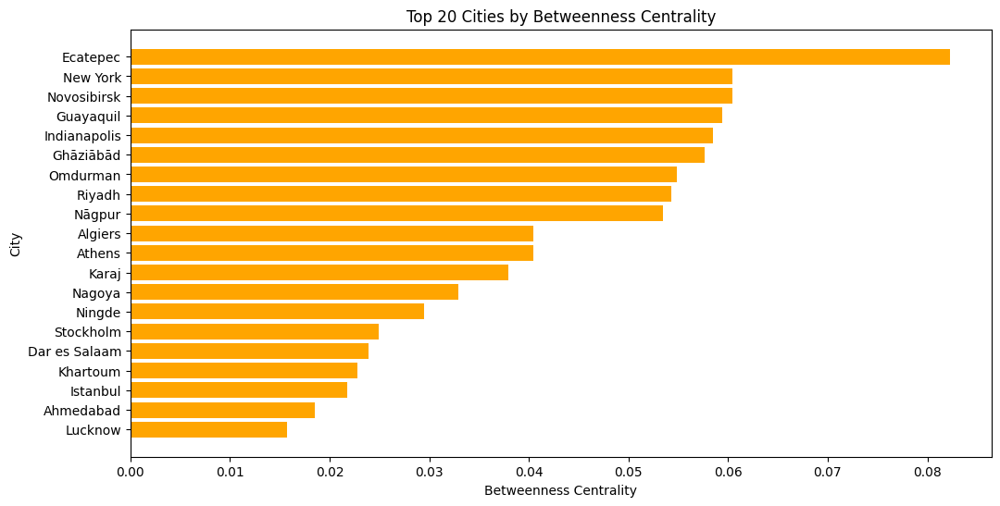

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Compute betweenness centrality
betweenness_centrality = nx.betweenness_centrality(G_cities)

# Sort nodes by betweenness centrality
sorted_betweenness = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)

# Print Top 10 cities with highest betweenness centrality
print("\n🔹 Top 10 Cities with Highest Betweenness Centrality:")
for city, centrality in sorted_betweenness[:10]:
    print(f"{city}: {centrality:.4f}")

# Visualize Top 20 cities with highest betweenness centrality
plt.figure(figsize=(12, 6))
plt.barh([node for node, _ in sorted_betweenness[:20]][::-1],
         [value for _, value in sorted_betweenness[:20]][::-1], color='orange')

plt.xlabel("Betweenness Centrality")
plt.ylabel("City")
plt.title("Top 20 Cities by Betweenness Centrality")
plt.show()


### ACTIONABLE INSIGHTS
- Prioritize playing these cities to maintain control over movement options.
- Force the opponent into low-betweenness cities, as these tend to limit their escape routes.
- If you remove a city with high betweenness, it breaks many connections, stranding the opponent.
- A city that wasn't important early game can become a crucial connector later, so adjust play dynamically.

In [ ]:
# Smart Player Strategy: Force opponent into the lowest betweenness centrality move
def smart_betweenness_move(graph, current_city, visited):
    successors = [i for i in list(graph.successors(current_city)) if i not in visited]
    if not successors:
        return None  # No valid moves

    # Compute approximate betweenness centrality for speed
    centrality = nx.betweenness_centrality(graph, k=10)

    # Choose the move with the lowest betweenness centrality to trap the opponent
    return min(successors, key=lambda x: centrality.get(x, float('inf')), default=None)

# Run multiple simulations comparing Smart Betweenness Player vs. Random Player
num_simulations = 100
smart_wins, random_wins, draws = 0, 0, 0

for start_city in random.sample(list(G_cities.nodes), num_simulations):
    result = simulate_game(G_cities, start_city, smart_betweenness_move, random_player_move, max_moves=50)

    if result == 0:
        random_wins += 1  # Smart Player lost
    elif result == 1:
        smart_wins += 1  # Random Player lost
    else:
        draws += 1  # Max moves reached

# Print results
print(f"\n📊 Smart Betweenness Player Wins: {smart_wins} ({(smart_wins / num_simulations) * 100:.2f}%)")
print(f"❌ Random Player Wins: {random_wins} ({(random_wins / num_simulations) * 100:.2f}%)")
print(f"➖ Draws: {draws} ({(draws / num_simulations) * 100:.2f}%)")



📊 Smart Betweenness Player Wins: 69 (69.00%)
❌ Random Player Wins: 31 (31.00%)
➖ Draws: 0 (0.00%)


## EIGENVECTOR CENTRALITY
- Let's get freaky chat
- Eigenvector centrality measures the influence or importance of a node within a network, taking into account not just the number of connections a node has, but also the importance of its connected neighbors, meaning a node is considered more influential if it is connected to other highly influential nodes within the network.
- My hypothesis is that by playing cities with a higher eigenvector centrality, we eliminate key bridges components in a graph.
- Unlike simple degree centrality which just counts connections, eigenvector centrality considers the quality of connections, giving more weight to links with highly connected nodes.
- A node gains more influence if it is connected to other influential nodes, even if it doesn't have a large number of direct connections itself.


🔹 Average Eigenvector Centrality by Ending Letter:


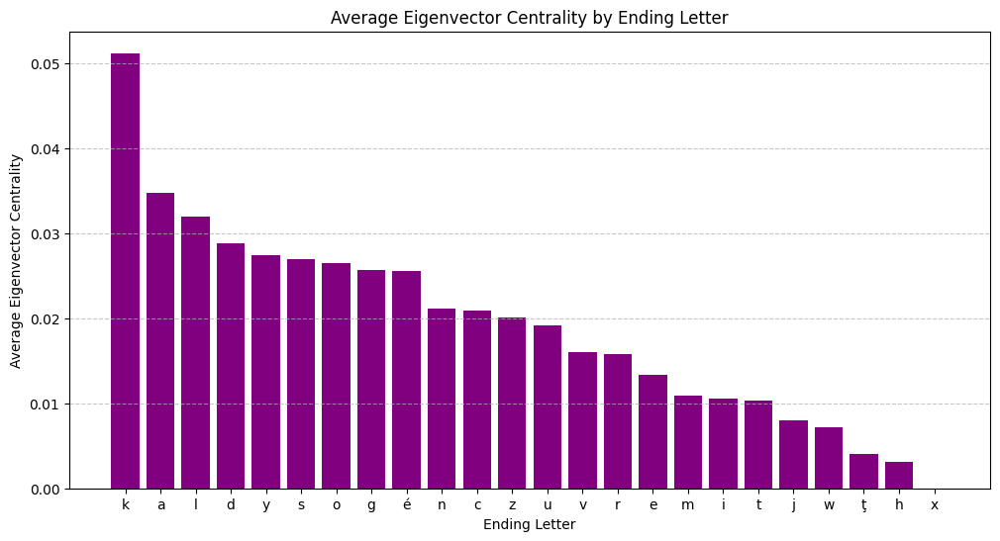

In [ ]:
from collections import defaultdict
import matplotlib.pyplot as plt
import numpy as np


# Compute Eigenvector Centrality with better convergence settings
eigenvector_centrality = nx.eigenvector_centrality(G_cities, max_iter=1000, tol=1e-6)

# Group eigenvector centrality values by last letter of city names
ending_letter_eigenvector = defaultdict(list)

for city, score in eigenvector_centrality.items():
    last_letter = city[-1].lower()
    ending_letter_eigenvector[last_letter].append(score)

# Compute the average eigenvector centrality for each ending letter
avg_eigenvector_by_letter = {letter: np.mean(scores) for letter, scores in ending_letter_eigenvector.items()}

# Sort the dictionary by average eigenvector centrality
sorted_letters = sorted(avg_eigenvector_by_letter.items(), key=lambda x: x[1], reverse=True)

# Print sorted average eigenvector centrality by letter
print("\n🔹 Average Eigenvector Centrality by Ending Letter:")
for letter, avg_score in sorted_letters:
    # print(f"{letter.upper()}: {avg_score:.4f}")
    pass

# Extract letters and scores for plotting
letters, avg_scores = zip(*sorted_letters)

# Bar plot of average eigenvector centrality by ending letter
plt.figure(figsize=(12, 6))
plt.bar(letters, avg_scores, color="purple")

plt.xlabel("Ending Letter")
plt.ylabel("Average Eigenvector Centrality")
plt.title("Average Eigenvector Centrality by Ending Letter")
plt.xticks(rotation=0)  # Keep letter labels horizontal
plt.grid(axis="y", linestyle="--", alpha=0.7)

plt.show()


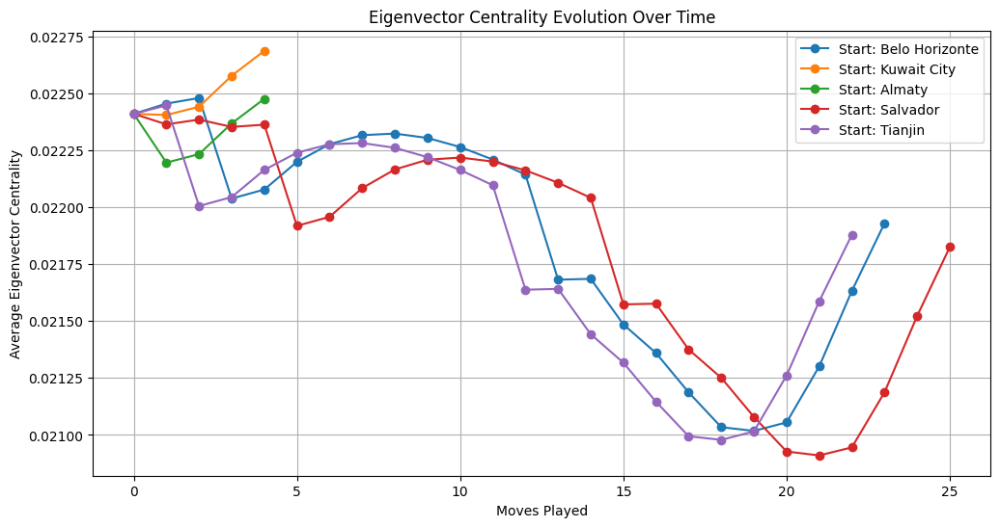

In [ ]:
# Function to track Eigenvector Centrality evolution during a game
def simulate_game_and_track_eigenvector(graph, start_city, max_moves=50):
    current_graph = graph.copy()
    visited = set()

    avg_eigenvector = []
    move_number = []

    current_city = start_city

    for move in range(max_moves):
        if current_city not in current_graph or not list(current_graph.successors(current_city)):
            break  # No moves left

        # Compute Eigenvector Centrality at current time step
        eigenvector_scores = nx.eigenvector_centrality(current_graph)
        avg_eigenvector.append(sum(eigenvector_scores.values()) / len(eigenvector_scores))  # Mean Eigenvector Centrality
        move_number.append(move)

        # Ensure we only select unvisited successors
        successors = [i for i in list(current_graph.successors(current_city)) if i not in visited]
        if not successors:
            break  # No valid moves

        # Choose the move that forces the opponent into a low-Eigenvector region
        next_city = min(successors, key=lambda x: eigenvector_scores.get(x, float('inf')), default=None)

        # Remove current city from graph
        current_graph.remove_node(current_city)
        visited.add(current_city)
        current_city = next_city

    return move_number, avg_eigenvector

# Run multiple simulations and track Eigenvector evolution
start_cities = random.sample(list(G_cities.nodes), 5)  # Choose 5 random starting cities
simulations = {city: simulate_game_and_track_eigenvector(G_cities, city, max_moves=50) for city in start_cities}

# Plot Eigenvector evolution over time
plt.figure(figsize=(12, 6))
for city, (moves, eigenvector) in simulations.items():
    plt.plot(moves, eigenvector, marker='o', linestyle='-', label=f'Start: {city}')

plt.xlabel("Moves Played")
plt.ylabel("Average Eigenvector Centrality")
plt.title("Eigenvector Centrality Evolution Over Time")
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
ending_letter_EC_dict={}
# Smart Player Strategy: Forces opponent into the lowest Eigenvector city
def smart_eigenvector_move(graph, current_city, visited):
    successors = [i for i in list(graph.successors(current_city)) if i not in visited]
    if not successors:
        return None  # No valid moves

    # Compute Eigenvector Centrality
    eigenvector_scores = nx.eigenvector_centrality(graph)

    # Choose the move with the highest Eigenvector Centrality to trap the opponent
    move=max(successors, key=lambda x: eigenvector_scores.get(x, float('-inf')), default=None)
    l=move[-1]
    if l in ending_letter_EC_dict:
        ending_letter_EC_dict[l]+=1
    else:
        ending_letter_EC_dict[l]=1
    return move

# Run multiple simulations comparing Smart Eigenvector Player vs. Random Player
num_simulations = 100
smart_wins, random_wins, draws = 0, 0, 0

for start_city in random.sample(list(G_cities.nodes), num_simulations):
    result = simulate_game(G_cities, start_city, smart_eigenvector_move, random_player_move, max_moves=50)

    if result == 0:
        random_wins += 1  # Smart Player lost
    elif result == 1:
        smart_wins += 1  # Random Player lost
    else:
        draws += 1  # Max moves reached

# Print results
print(f"\nSmart Eigenvector Player Wins: {smart_wins} ({(smart_wins / num_simulations) * 100:.2f}%)")
print(f"Random Player Wins: {random_wins} ({(random_wins / num_simulations) * 100:.2f}%)")
print(f"Draws: {draws} ({(draws / num_simulations) * 100:.2f}%)")
# print(ending_letter_EC_dict)


Smart Eigenvector Player Wins: 68 (68.00%)
Random Player Wins: 32 (32.00%)
Draws: 0 (0.00%)


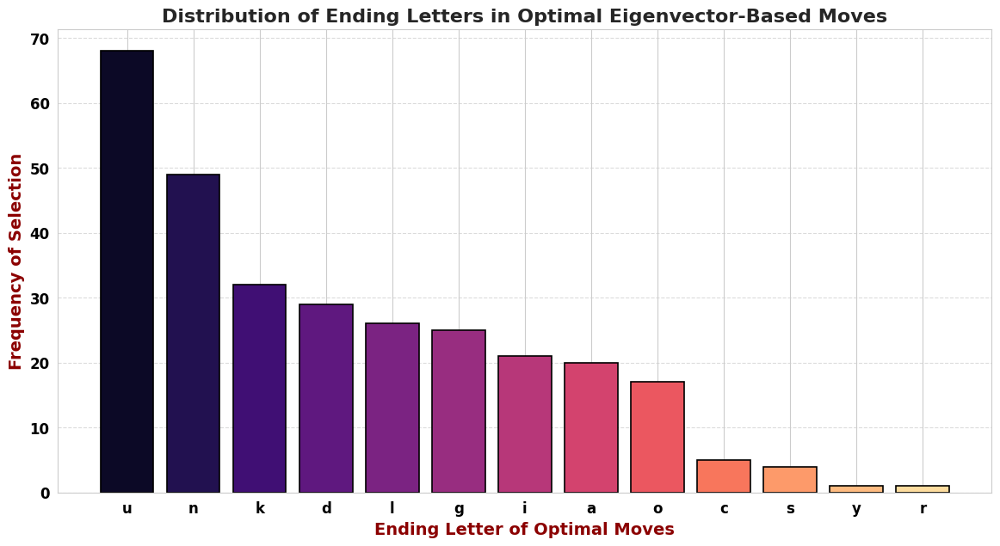

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Convert dictionary to sorted list for visualization
sorted_ending_letters = sorted(ending_letter_EC_dict.items(), key=lambda x: x[1], reverse=True)

# Extract letters and counts
letters, counts = zip(*sorted_ending_letters)

# Set figure aesthetics using seaborn
sns.set_style("whitegrid")
plt.figure(figsize=(14, 7))

# Create a **colorful** bar plot
colors = sns.color_palette("magma", len(letters))  # Beautiful color mapping
plt.bar(letters, counts, color=colors, edgecolor="black", linewidth=1.2)

# Title & Labels
plt.xlabel("Ending Letter of Optimal Moves", fontsize=14, fontweight="bold", color="darkred")
plt.ylabel("Frequency of Selection", fontsize=14, fontweight="bold", color="darkred")
plt.title("Distribution of Ending Letters in Optimal Eigenvector-Based Moves", fontsize=16, fontweight="bold")

# Improve aesthetics
plt.xticks(fontsize=12, fontweight="bold", color="black")
plt.yticks(fontsize=12, fontweight="bold", color="black")

# Add grid for readability
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Show the plot
plt.show()


### ACTIONABLE INSIGHTS
- As we can see, the data above pretty nicely tracks with what we already know. Getting your opponents to name cities starting with letters that were more frequently chosen as the optimal move based on their eigenvector centrality seems to end the game sooner and result in more victories.

## GRAPH DENSITY
- A denser graph suggests more available moves and potentially longer gameplay.
- So we try to make the move that reduces the graph density as much as possible so that the opponent has the least options available.
- Or at least, that's what you'd think right?
- WRONG YOU'RE DUMB AND NO ONE LOVES YOU THE ACTUAL SMART THING TO DO IS PICK THE MOVE THAT MAXIMIZES THE GRAPH DENSITY.


🔹 Initial Graph Density: 0.0292


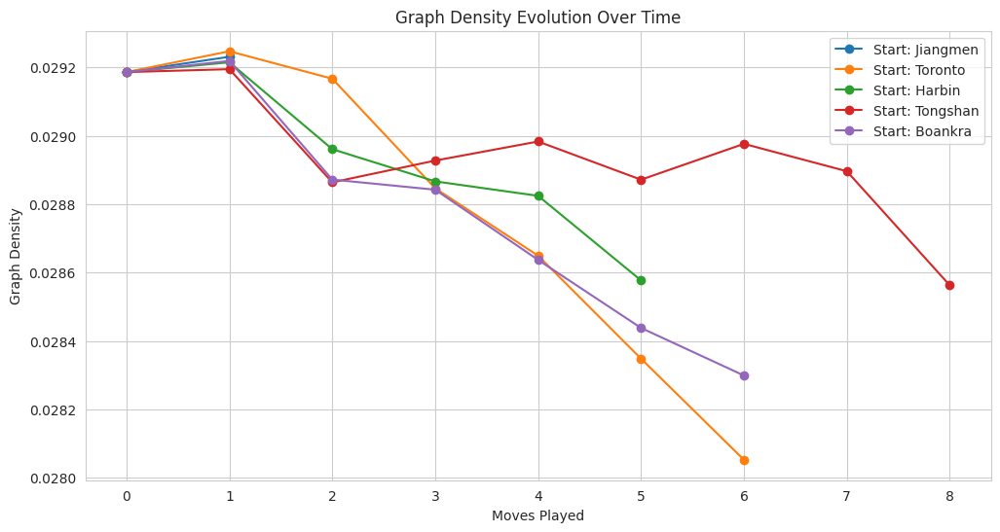

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Compute initial graph density
initial_density = nx.density(G_cities)

# Print the density value
print(f"\n🔹 Initial Graph Density: {initial_density:.4f}")

# Function to simulate density change over time
def track_graph_density(graph, start_city, max_moves=50):
    current_graph = graph.copy()
    visited = set()

    densities = []
    move_number = []

    current_city = start_city

    for move in range(max_moves):
        if current_city not in current_graph or not list(current_graph.successors(current_city)):
            break  # No moves left

        # Compute graph density at this time step
        densities.append(nx.density(current_graph))
        move_number.append(move)

        # Ensure we only select unvisited successors
        successors = [i for i in list(current_graph.successors(current_city)) if i not in visited]
        if not successors:
            break  # No valid moves

        # Choose the next move at random (we are just tracking density)
        next_city = random.choice(successors)

        # Remove current city and move forward
        current_graph.remove_node(current_city)
        visited.add(current_city)
        current_city = next_city

    return move_number, densities

# Run multiple simulations to track density changes
start_cities = random.sample(list(G_cities.nodes), 5)
simulations = {city: track_graph_density(G_cities, city, max_moves=50) for city in start_cities}

# Plot graph density evolution
plt.figure(figsize=(12, 6))
for city, (moves, density) in simulations.items():
    plt.plot(moves, density, marker='o', linestyle='-', label=f'Start: {city}')

plt.xlabel("Moves Played")
plt.ylabel("Graph Density")
plt.title("Graph Density Evolution Over Time")
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
import random
# Smart Player Strategy: Moves that reduce graph density the fastest
def smart_density_move(graph, current_city, visited):
    successors = [i for i in list(graph.successors(current_city)) if i not in visited]
    if not successors:
        return None  # No valid moves

    # Compute the density impact of each possible move
    density_drop = {}
    for city in successors:
        temp_graph = graph.copy()
        temp_graph.remove_node(city)
        density_drop[city] = nx.density(temp_graph)

    # Choose the move that causes the **lowest density drop**
    return max(density_drop, key=density_drop.get, default=None)

# Run multiple simulations comparing Smart Density Player vs. Random Player
num_simulations = 100
smart_wins, random_wins, draws = 0, 0, 0

for start_city in random.sample(list(G_cities.nodes), num_simulations):
    result = simulate_game(G_cities, start_city, smart_density_move, random_player_move, max_moves=50)

    if result == 0:
        random_wins += 1  # Smart Player lost
    elif result == 1:
        smart_wins += 1  # Random Player lost
    else:
        draws += 1  # Max moves reached

# Print results
print(f"\nSmart Density Player Wins: {smart_wins} ({(smart_wins / num_simulations) * 100:.2f}%)")
print(f"Random Player Wins: {random_wins} ({(random_wins / num_simulations) * 100:.2f}%)")
print(f"Draws: {draws} ({(draws / num_simulations) * 100:.2f}%)")



Smart Density Player Wins: 81 (81.00%)
Random Player Wins: 19 (19.00%)
Draws: 0 (0.00%)


### ACTIONABLE INSIGHTS
- Intuitively, it makes sense for the optimal move to be the one that would decrease the density by the most, but this isn't the case.
- To be fully honest, i don't get why at this point in time esepcailly since the survival times are kind of similar regardless of which of the two we pick

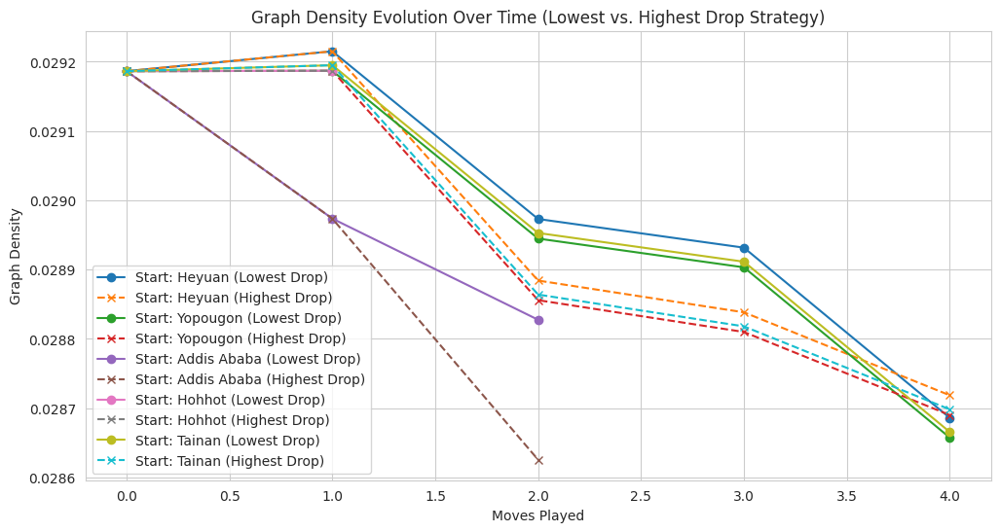

In [ ]:
# Function to track density evolution under both strategies
def track_density_comparison(graph, start_city, max_moves=50):
    current_graph_1 = graph.copy()
    current_graph_2 = graph.copy()
    visited_1, visited_2 = set(), set()

    densities_lowest_drop, densities_highest_drop = [], []
    move_number = []

    current_city_1, current_city_2 = start_city, start_city

    for move in range(max_moves):
        if (current_city_1 not in current_graph_1 or not list(current_graph_1.successors(current_city_1))) and \
           (current_city_2 not in current_graph_2 or not list(current_graph_2.successors(current_city_2))):
            break  # No moves left

        # Compute graph density at this time step
        densities_lowest_drop.append(nx.density(current_graph_1))
        densities_highest_drop.append(nx.density(current_graph_2))
        move_number.append(move)

        # Ensure we only select unvisited successors
        successors_1 = [i for i in list(current_graph_1.successors(current_city_1)) if i not in visited_1]
        successors_2 = [i for i in list(current_graph_2.successors(current_city_2)) if i not in visited_2]

        if not successors_1 or not successors_2:
            break  # No valid moves

        # Strategy 1: Choose move with lowest density drop
        density_drop_1 = {city: nx.density(nx.subgraph(current_graph_1, set(current_graph_1.nodes) - {city})) for city in successors_1}
        next_city_1 = max(density_drop_1, key=density_drop_1.get, default=None)

        # Strategy 2: Choose move with highest density drop
        density_drop_2 = {city: nx.density(nx.subgraph(current_graph_2, set(current_graph_2.nodes) - {city})) for city in successors_2}
        next_city_2 = min(density_drop_2, key=density_drop_2.get, default=None)

        # Remove current cities and move forward
        if next_city_1:
            current_graph_1.remove_node(current_city_1)
            visited_1.add(current_city_1)
            current_city_1 = next_city_1

        if next_city_2:
            current_graph_2.remove_node(current_city_2)
            visited_2.add(current_city_2)
            current_city_2 = next_city_2

    return move_number, densities_lowest_drop, densities_highest_drop

# Run density tracking simulation for multiple start cities
start_cities = random.sample(list(G_cities.nodes), 5)
simulations = {city: track_density_comparison(G_cities, city, max_moves=50) for city in start_cities}

# Plot graph density evolution for both strategies
plt.figure(figsize=(12, 6))
for city, (moves, density_lowest, density_highest) in simulations.items():
    plt.plot(moves, density_lowest, marker='o', linestyle='-', label=f'Start: {city} (Lowest Drop)')
    plt.plot(moves, density_highest, marker='x', linestyle='--', label=f'Start: {city} (Highest Drop)')

plt.xlabel("Moves Played")
plt.ylabel("Graph Density")
plt.title("Graph Density Evolution Over Time (Lowest vs. Highest Drop Strategy)")
plt.legend()
plt.grid(True)
plt.show()


## ALGEBRAIC CONNECTIVITY / FIEDLER VALUE
- A high algebraic connectivity means the game is open-ended and flexible.
- A low algebraic connectivity means the game is near collapse, leading to a forced-play scenario.



🔹 Algebraic Connectivity: 0.7786+0.0000j


/usr/local/lib/python3.11/dist-packages/matplotlib/cbook.py:1709: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/usr/local/lib/python3.11/dist-packages/matplotlib/transforms.py:757: ComplexWarning: Casting complex values to real discards the imaginary part
  points = np.asarray(points, float)


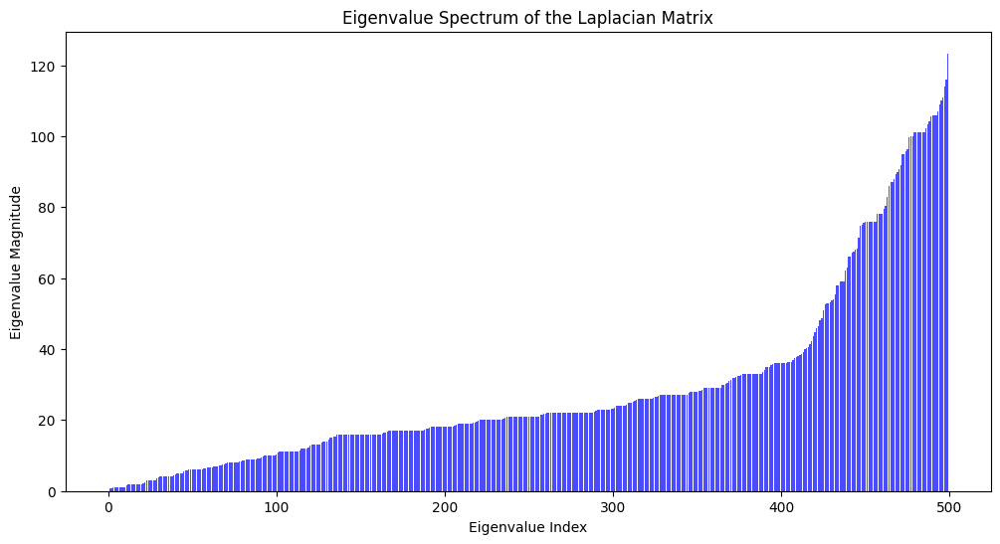

In [ ]:
import networkx as nx
import numpy as np
import scipy.linalg
import matplotlib.pyplot as plt

G = G_cities.copy()
# Convert directed graph to undirected for algebraic connectivity computation
G_undirected = G.to_undirected()

# Compute Laplacian matrix
L = nx.laplacian_matrix(G_undirected).toarray()

# Compute eigenvalues of Laplacian matrix
eigenvalues = np.linalg.eigvals(L)
eigenvalues.sort()

# Algebraic connectivity is the second smallest eigenvalue
algebraic_connectivity = eigenvalues[1] if len(eigenvalues) > 1 else 0

print(f"\n🔹 Algebraic Connectivity: {algebraic_connectivity:.4f}")

# Visualize Eigenvalue Spectrum
plt.figure(figsize=(12, 6))
plt.bar(range(len(eigenvalues)), eigenvalues, color='blue', alpha=0.7)
plt.xlabel("Eigenvalue Index")
plt.ylabel("Eigenvalue Magnitude")
plt.title("Eigenvalue Spectrum of the Laplacian Matrix")
plt.show()


/usr/local/lib/python3.11/dist-packages/matplotlib/cbook.py:1709: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/usr/local/lib/python3.11/dist-packages/matplotlib/cbook.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


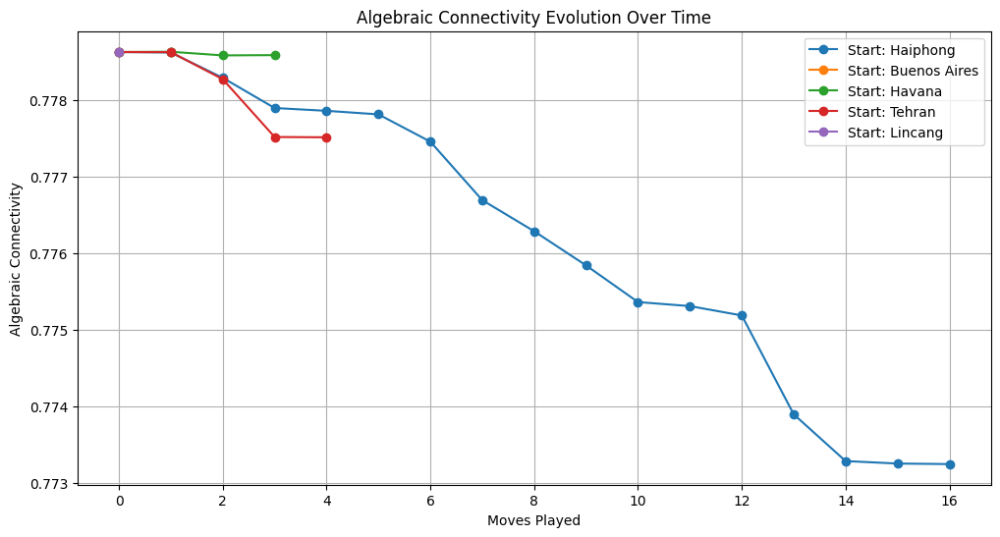

In [ ]:
import random
# Function to track algebraic connectivity over time
def track_algebraic_connectivity(graph, start_city, max_moves=50):
    current_graph = graph.copy()
    visited = set()

    connectivity_values = []
    move_number = []

    current_city = start_city

    for move in range(max_moves):
        if current_city not in current_graph or not list(current_graph.successors(current_city)):
            break  # No moves left

        # Convert to undirected and compute algebraic connectivity
        G_undirected = current_graph.to_undirected()
        L = nx.laplacian_matrix(G_undirected).toarray()
        eigenvalues = np.linalg.eigvals(L)
        eigenvalues.sort()
        algebraic_conn = eigenvalues[1] if len(eigenvalues) > 1 else 0

        connectivity_values.append(algebraic_conn)
        move_number.append(move)

        # Ensure we only select unvisited successors
        successors = [i for i in list(current_graph.successors(current_city)) if i not in visited]
        if not successors:
            break  # No valid moves

        # Choose the next move at random (we are just tracking graph evolution)
        next_city = random.choice(successors)

        # Remove current city and move forward
        current_graph.remove_node(current_city)
        visited.add(current_city)
        current_city = next_city

    return move_number, connectivity_values

# Run multiple simulations for different starting cities
start_cities = random.sample(list(G.nodes), 5)
simulations = {city: track_algebraic_connectivity(G, city, max_moves=50) for city in start_cities}

# Plot algebraic connectivity evolution over time
plt.figure(figsize=(12, 6))
for city, (moves, connectivity_values) in simulations.items():
    plt.plot(moves, connectivity_values, marker='o', linestyle='-', label=f'Start: {city}')

plt.xlabel("Moves Played")
plt.ylabel("Algebraic Connectivity")
plt.title("Algebraic Connectivity Evolution Over Time")
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
# Smart Player Strategy: Moves that reduce the opponent's algebraic connectivity
def smart_algebraic_connectivity_move(graph, current_city, visited):
    successors = [i for i in list(graph.successors(current_city)) if i not in visited]
    if not successors:
        return None  # No valid moves

    # Compute algebraic connectivity impact of each move
    connectivity_impact = {}
    for city in successors:
        temp_graph = graph.copy()
        temp_graph.remove_node(city)

        # Compute new algebraic connectivity
        G_undirected = temp_graph.to_undirected()
        L = nx.laplacian_matrix(G_undirected).toarray()
        eigenvalues = np.linalg.eigvals(L)
        eigenvalues.sort()
        algebraic_conn = eigenvalues[1] if len(eigenvalues) > 1 else 0

        connectivity_impact[city] = algebraic_conn

    # Choose the move that maximizes algebraic connectivity
    return max(connectivity_impact, key=connectivity_impact.get, default=None)

# Run multiple simulations comparing Smart Algebraic Player vs. Random Player
num_simulations = 100
smart_wins, random_wins, draws = 0, 0, 0
i=0
for start_city in random.sample(list(G.nodes), num_simulations):
    result = simulate_game(G, start_city, smart_algebraic_connectivity_move, random_player_move, max_moves=50)
    i+=1
    print("Game number",i,"concluded")
    if result == 0:
        random_wins += 1  # Smart Player lost
    elif result == 1:
        smart_wins += 1  # Random Player lost
    else:
        draws += 1  # Max moves reached

# Print results
print(f"\nSmart Algebraic Player Wins: {smart_wins} ({(smart_wins / num_simulations) * 100:.2f}%)")
print(f"Random Player Wins: {random_wins} ({(random_wins / num_simulations) * 100:.2f}%)")
print(f"Draws: {draws} ({(draws / num_simulations) * 100:.2f}%)")


Game number 1 concluded
Game number 2 concluded
Game number 3 concluded
Game number 4 concluded
Game number 5 concluded
Game number 6 concluded
Game number 7 concluded
Game number 8 concluded
Game number 9 concluded
Game number 10 concluded
Game number 11 concluded
Game number 12 concluded
Game number 13 concluded
Game number 14 concluded
Game number 15 concluded
Game number 16 concluded
Game number 17 concluded
Game number 18 concluded
Game number 19 concluded
Game number 20 concluded
Game number 21 concluded
Game number 22 concluded
Game number 23 concluded
Game number 24 concluded
Game number 25 concluded
Game number 26 concluded
Game number 27 concluded
Game number 28 concluded
Game number 29 concluded
Game number 30 concluded
Game number 31 concluded
Game number 32 concluded
Game number 33 concluded
Game number 34 concluded
Game number 35 concluded
Game number 36 concluded
Game number 37 concluded
Game number 38 concluded
Game number 39 concluded
Game number 40 concluded
Game numb

## FINAL BATTLE
- Ladies and gentlemen, we've seen some truly fine warriors throuhgout this journey. From the raging tenacity of betweenness centrality to the overwhelming intensity of the indegree to outdegree ratio, the competition has been fierce.
- But in the end, there can be only one. Only one graph property can rule them all. The strongest. The unparalleled. The honoured one.
- For this final epic 1v1, I've selected the two fighters with the highest win rate: algebraic connectivity and in degree to out degree ratio. They will go head to head in one conclusive battle to decide who gets to etch their names in the annals of history, and who gets erased from it. May the best win.

In [11]:
# Function to compute in-degree to out-degree ratio for each city
def compute_ratio(graph):
    in_degrees = dict(graph.in_degree())
    out_degrees = dict(graph.out_degree())
    return {node: in_degrees[node] / (out_degrees[node] + 1) for node in graph.nodes}  # Avoid division by zero

# FIGHTER 1
def smart_inout_move(graph, current_city, visited):
    successors = [i for i in list(graph.successors(current_city)) if i not in visited]
    if not successors:
        return None  # No valid moves

    return max(successors, key=lambda x: compute_ratio(graph).get(x, 0), default=None)

# FIGHTER 2
def smart_algebraic_connectivity_move(graph, current_city, visited):
    successors = [i for i in list(graph.successors(current_city)) if i not in visited]
    if not successors:
        return None  # No valid moves

    # Compute algebraic connectivity impact of each move
    connectivity_impact = {}
    for city in successors:
        temp_graph = graph.copy()
        temp_graph.remove_node(city)

        # Compute new algebraic connectivity
        G_undirected = temp_graph.to_undirected()
        L = nx.laplacian_matrix(G_undirected).toarray()
        eigenvalues = np.linalg.eigvals(L)
        eigenvalues.sort()
        algebraic_conn = eigenvalues[1] if len(eigenvalues) > 1 else 0

        connectivity_impact[city] = algebraic_conn

    # Choose the move that **minimizes** algebraic connectivity (forces opponent into weak regions)
    return max(connectivity_impact, key=connectivity_impact.get, default=None)

In [ ]:
# the final 1v1: smart algebraic player versus smart in/out degree ratio player
num_simulations = 100
ac_player_wins, inout_player_wins, draws = 0, 0, 0
i=0
for start_city in random.sample(list(G.nodes), num_simulations):
    result = simulate_game(G, start_city, smart_algebraic_connectivity_move, smart_inout_move, max_moves=50)
    i+=1
    print("Game number",i,"concluded")
    if result == 0:
        inout_player_wins += 1  # Smart Player lost
    elif result == 1:
        ac_player_wins += 1  # Random Player lost
    else:
        draws += 1  # Max moves reached

# Print results
print(f"\nSmart Algebraic Player Wins: {ac_player_wins} ({(ac_player_wins / num_simulations) * 100:.2f}%)")
print(f"Smart inout player wins: {inout_player_wins} ({(inout_player_wins / num_simulations) * 100:.2f}%)")
print(f"Draws: {draws} ({(draws / num_simulations) * 100:.2f}%)")


Game number 1 concluded
Game number 2 concluded
Game number 3 concluded
Game number 4 concluded
Game number 5 concluded
Game number 6 concluded
Game number 7 concluded
Game number 8 concluded
Game number 9 concluded
Game number 10 concluded
Game number 11 concluded
Game number 12 concluded
Game number 13 concluded
Game number 14 concluded
Game number 15 concluded
Game number 16 concluded
Game number 17 concluded
Game number 18 concluded
Game number 19 concluded
Game number 20 concluded
Game number 21 concluded
Game number 22 concluded
Game number 23 concluded
Game number 24 concluded
Game number 25 concluded
Game number 26 concluded
Game number 27 concluded
Game number 28 concluded
Game number 29 concluded
Game number 30 concluded
Game number 31 concluded
Game number 32 concluded
Game number 33 concluded
Game number 34 concluded
Game number 35 concluded
Game number 36 concluded
Game number 37 concluded
Game number 38 concluded
Game number 39 concluded
Game number 40 concluded
Game numb

### WHY DOES ALGEBRAIC CONNECTIVITY WIN?
- My prevailing hypothesis consists of two key points:
  - Algebraic Connectivity strategy thinks about the entire graph's structural collapse, ensuring the opponent has no options in the long run, rather than just the next move.
  - In-Out Degree Ratio works well early-game, but as cities are removed, it does not consider long-term connectivity collapse, which makes it weaker over time.